<a href="https://colab.research.google.com/github/Andrew11Morozov/ex.practic/blob/main/morozov_ab_rest_github_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Учебный проект "Подготовка презентации по исследованию рынка Москвы в интересах фонда «Shut Up and Take My Money»"

### Описание проекта

Фонд ***«Shut Up and Take My Money»*** решил попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики выбирают тип заведения - кафе, ресторан, пиццерия, паб или бар, также еще не определились с расположением, меню и ценами.
Для начала необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Презентация должна быть информативной и лаконичной. К выбору инструментов (matplotlib, seaborn и другие) и типам визуализаций дополнительных требований у заказчиков нет.
Для исследований доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

### Данные

Данные храняться по ссылке:\
    https://code.s3.yandex.net/datasets/moscow_places.csv
    
Описание данных:

Файл `moscow_places.csv`:

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
         и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым
        1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

### Загрузка данных

In [ ]:
import pandas as pd
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import warnings
# конвертеры, которые позволяют использовать типы pandas в matplotlib  
#register_matplotlib_converters()
import scipy.stats as stats
import math
import plotly.express as px
from IPython.display import Image
from plotly import graph_objects as go
import json
from folium import Map, Choropleth

In [ ]:
df = pd.read_csv('/datasets/moscow_places.csv') # загружаю данные из moscow_places.csv - описание заведений общ. питания Москвы

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [ ]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [ ]:
print ('В датасете представлено ', df.shape[0], 'заведений питания г. Москвы')

В датасете представлено  8406 заведений питания г. Москвы


Типы значений представлены в таблице df.info() и в основном соответствуют описаниям.

## Предобработка данных

### Проверка дубликатов

In [ ]:
df[df.duplicated ()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Явных полных дубликатов не выявлено.

#### Проверка неявных дубликатов

Расширим поиск до адреса и названия, исключив таким образом возможность попадания одних и тех же заведений из разных баз данных.

In [ ]:
df[df.duplicated(['address', 'name'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Таких неполных дубликатов тоже не обнаружено.

### Оценка пропусков

In [ ]:
# check
# пропущенные значения бары

def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind= 'barh', figsize=(19,6), rot = -5, legend = False, fontsize = 16)
            .set_title('Процент пропуска в данных' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) ')

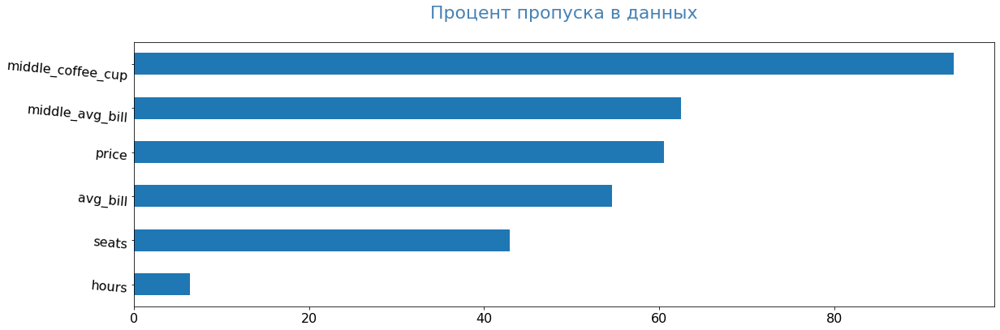

In [ ]:
pass_value_barh(df)

In [ ]:
print('Данных middle_coffee_cup - ', df['middle_coffee_cup'].notna().sum(), 'значений из ', df.shape[0], '.')

Данных middle_coffee_cup -  535 значений из  8406 .


middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино». ***Пропуски допустимы***.

In [ ]:
print('Данных middle_avg_bill - ', df['middle_avg_bill'].notna().sum(), 'значений из ', df.shape[0], '.')

Данных middle_avg_bill -  3149 значений из  8406 .


middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт». ***Пропуски допустимы***.

In [ ]:
print('Данных price - ', df['price'].notna().sum(), 'значений из ', df.shape[0], '.')

Данных price -  3315 значений из  8406 .


price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее. ***Пропуски допустимы***.

In [ ]:
print('Данных avg_bill - ', df['avg_bill'].notna().sum(), 'значений из ', df.shape[0], '.')

Данных avg_bill -  3816 значений из  8406 .


avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона. ***Пропуски допустимы***.

In [ ]:
print('Данных seats - ', df['seats'].notna().sum(), 'значений из ', df.shape[0], '.')

Данных seats -  4795 значений из  8406 .


seats — количество посадочных мест. ***Пропуски допустимы***.

In [ ]:
print('Данных hours - ', df['hours'].notna().sum(), 'значений из ', df.shape[0], '.')

Данных hours -  7870 значений из  8406 .


hours — информация о днях и часах работы. ***Пропуски допустимы***.

Учтем эти пропуски данных в дальнейших оценках и выводах.

### Создание дополнительных колонок

#### Название улицы

Создадим столбец street с названиями улиц из столбца с адресом:

In [ ]:
# Воспользуемся подсказкой из Яндекса по запросу "выделить название улицы python":
pattern = '\,*,(([а-яА-Я1-9\-ё\s"]+)?(улица|переулок|шоссе|проспект|площадь|проезд|село|Проезд|аллея|бульвар|набережная|тупик|линия|)([а-яА-Яё1-9\-\s"]+)?)\,'
df['street'] = df['address'].str.extract(pat = pattern)[0]

In [ ]:
df['street'].unique()

array([' улица Дыбенко', ' Клязьминская улица',
       ' улица Маршала Федоренко', ..., ' улица Хлобыстова',
       ' Новороссийская улица', ' Чонгарский бульвар'], dtype=object)

<div class="alert alert-success">
<b>Комментарий ревьюера:</b>☀️
    
Отличный способ выделения улиц, нравится, что не опираешься на последовательность частей адреса

<div class="alert alert-info"> <b>Комментарий студента:</b> Принял.</div>

#### Признак круглосуточной работы

Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
        логическое значение True — если заведение работает ежедневно и круглосуточно;
        логическое значение False — в противоположном случае.

In [ ]:
df[' is_24_7'] = df['hours'] == "ежедневно, круглосуточно"

In [ ]:
print ('В Москве ', df[' is_24_7'].sum(), ' заведений общепита работает ежедневно, круглосуточно')

В Москве  730  заведений общепита работает ежедневно, круглосуточно


## Анализ данных

###  Категории заведений

Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.
Построим визуализации. 

In [ ]:
names_category = df ['category'].unique()
names_category # Массив названий категорий заведений общественного питания 

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [ ]:
df_category = df.groupby('category')['address'].count().reset_index()
df_category = df_category.sort_values(by = 'address', ascending=False).reset_index()
df_category = df_category.drop('index', axis=1)
df_category.columns = ['category', 'count']
df_category['ratio'] = round (df_category['count'] / (df_category['count'].sum()), 5)
df_category # Распределение заведений общественнного питания по категориям. сортировка от большего к меньшему

,category,count,ratio
0,кафе,2378,0.28289
1,ресторан,2043,0.24304
2,кофейня,1413,0.16809
3,"бар,паб",765,0.09101
4,пиццерия,633,0.07530
5,быстрое питание,603,0.07173
6,столовая,315,0.03747
7,булочная,256,0.03045


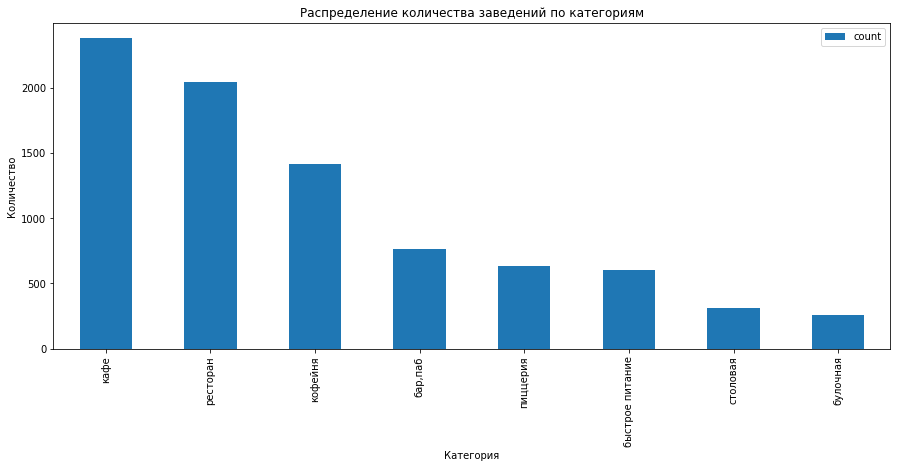

In [ ]:
df_category.plot(kind='bar', x='category', y='count', figsize= (15,6))
# Оформляем графики
plt.title('Распределение количества заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество', rotation=90)
plt.legend();

Интересно рассмотреть пропорции каждой категории:

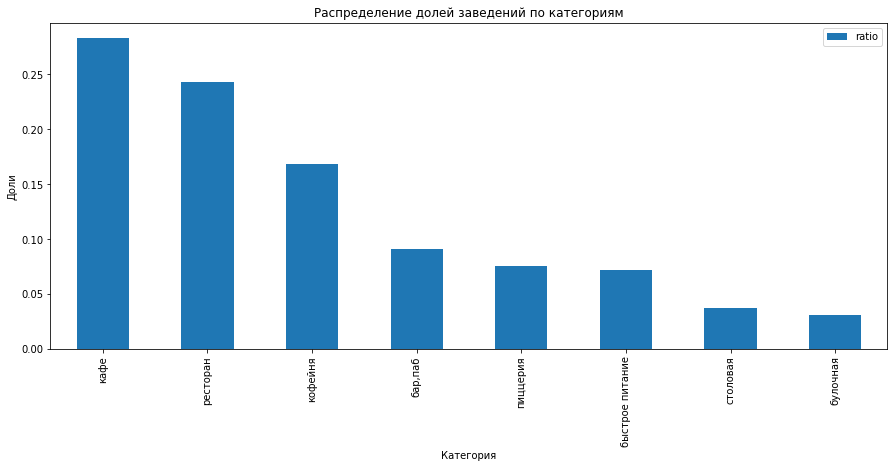

In [ ]:
#plt.figure(figsize=(16, 5))
df_category.plot(kind='bar', x='category', y='ratio', figsize= (15,6))
# Оформляем графики
plt.title('Распределение долей заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Доли', rotation=90)
plt.legend();

***Вывод по разделу:***

Заведения общественного питания распределены по категориям достаточно не равномерно:
Наибольшее количество заведений с категорией "Кафе" и "Ресторан", что не удивительно, так как это привычно для потребителя. Среди названий есть необычные - "Быстрое питание" и "Булочная", видимо для оригинальности и привлечения клиентов.

###  Количество посадочных мест по категориям заведений

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации.

In [ ]:
names_category

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [ ]:
names_category[0]

'кафе'

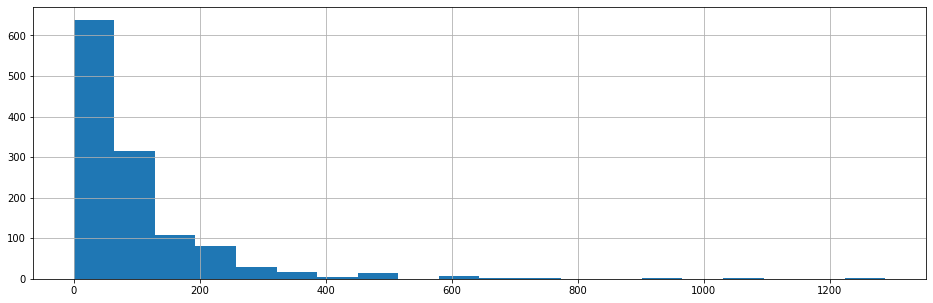

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "кафе"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "кафе"')['seats'].describe()

count    1218.000000
mean       97.512315
std       117.985084
min         0.000000
25%        35.250000
50%        60.000000
75%       120.000000
max      1288.000000
Name: seats, dtype: float64

В категории "кафе" 1218 точек. Среднее/медианное значение количества мест - 60/97 мест. Есть выбросы - 0 снизу, свыше 600 по вернему краю. 

In [ ]:
names_category[1]

'ресторан'

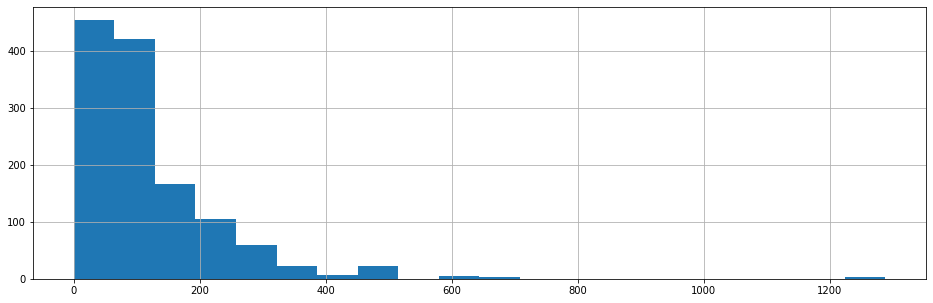

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "ресторан"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "ресторан"')['seats'].describe()

count    1270.000000
mean      121.944094
std       123.757335
min         0.000000
25%        48.000000
50%        86.000000
75%       150.000000
max      1288.000000
Name: seats, dtype: float64

В категории "ресторан" 1270 точек. Среднее/медианное значение количества мест - 86/122 мест. Есть выбросы - 0 снизу, свыше 600 по вернему краю. 

In [ ]:
names_category[2]

'кофейня'

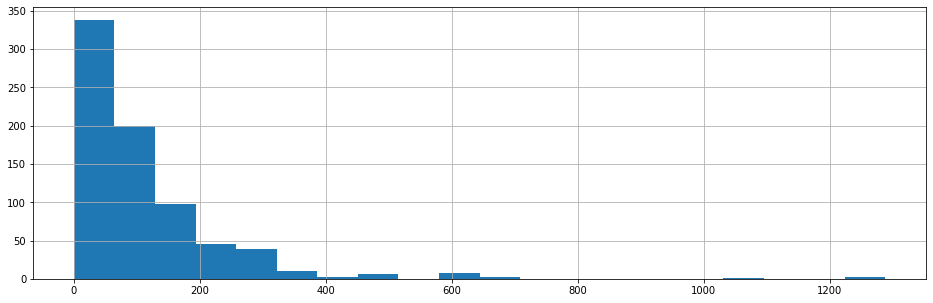

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "кофейня"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "кофейня"')['seats'].describe()

count     751.000000
mean      111.199734
std       127.837772
min         0.000000
25%        40.000000
50%        80.000000
75%       144.000000
max      1288.000000
Name: seats, dtype: float64

В категории "кофейня" 751 точка. Среднее/медианное значение количества мест - 80/111 мест. Есть выбросы - 0 снизу, свыше 600 по вернему краю.

In [ ]:
names_category[3]

'пиццерия'

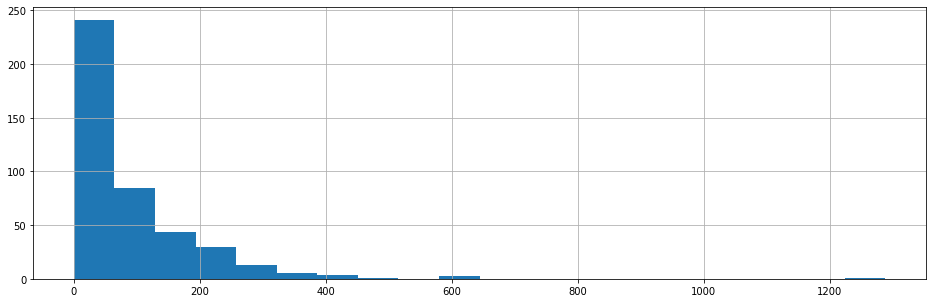

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "пиццерия"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "пиццерия"')['seats'].describe()

count     427.000000
mean       94.496487
std       112.282703
min         0.000000
25%        30.000000
50%        55.000000
75%       120.000000
max      1288.000000
Name: seats, dtype: float64

В категории "пиццерия" 427 точек. Среднее/медианное значение количества мест - 55/94 мест. Есть выбросы - 0 снизу, свыше 600 по вернему краю.

In [ ]:
names_category[4]

'бар,паб'

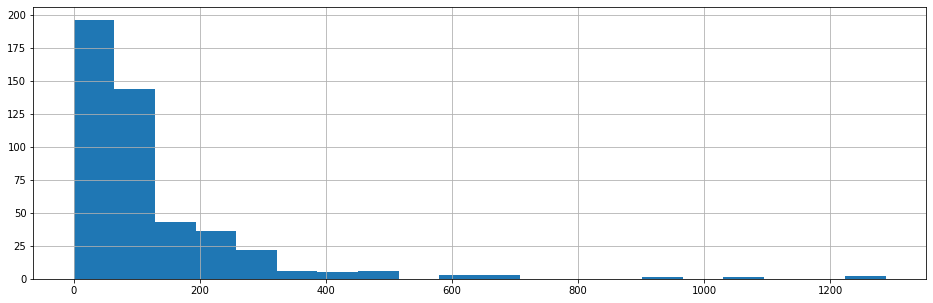

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "бар,паб"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "бар,паб"')['seats'].describe()

count     468.000000
mean      124.532051
std       145.011574
min         0.000000
25%        48.000000
50%        82.500000
75%       150.000000
max      1288.000000
Name: seats, dtype: float64

В категории "бар,паб" 468 точек. Среднее/медианное значение количества мест - 82/125 мест. Есть выбросы - 0 снизу, свыше 600 по вернему краю.

In [ ]:
names_category[5]

'быстрое питание'

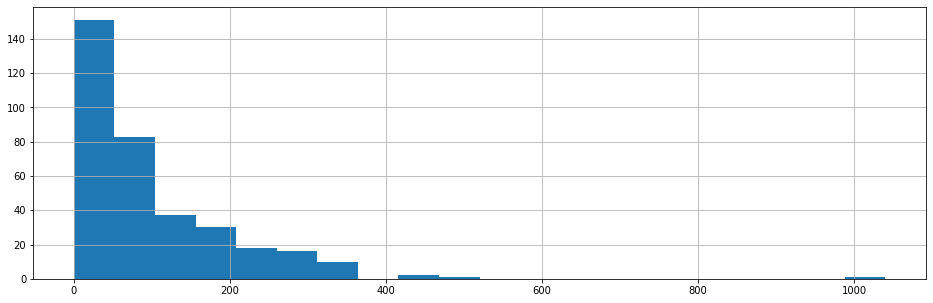

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "быстрое питание"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "быстрое питание"')['seats'].describe()

count     349.000000
mean       98.891117
std       106.611739
min         0.000000
25%        28.000000
50%        65.000000
75%       140.000000
max      1040.000000
Name: seats, dtype: float64

В категории "быстрое питание" 349 точек. Среднее/медианное значение количества мест - 65/99 мест. Есть выбросы - 0 снизу, свыше 400 по вернему краю.

In [ ]:
names_category[6]

'булочная'

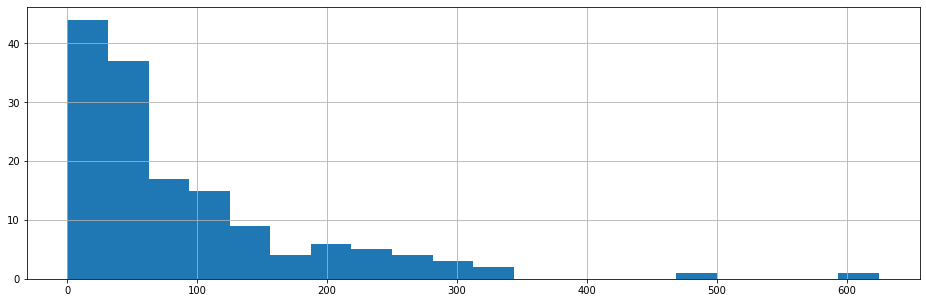

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "булочная"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "булочная"')['seats'].describe()

count    148.000000
mean      89.385135
std       97.685844
min        0.000000
25%       25.000000
50%       50.000000
75%      120.000000
max      625.000000
Name: seats, dtype: float64

В категории "булочная" 148 точек. Среднее/медианное значение количества мест - 50/89 мест. Есть выбросы - 0 снизу, свыше 350 по вернему краю. Необычно видеть в категории булочная заведение общественного питания на 200 посадочных мест. Если при дальнейшем исследовании появятся какие-нибудь дополнительные несоответствия, возможно, эту категорию необходимо исключить.

In [ ]:
names_category[7]

'столовая'

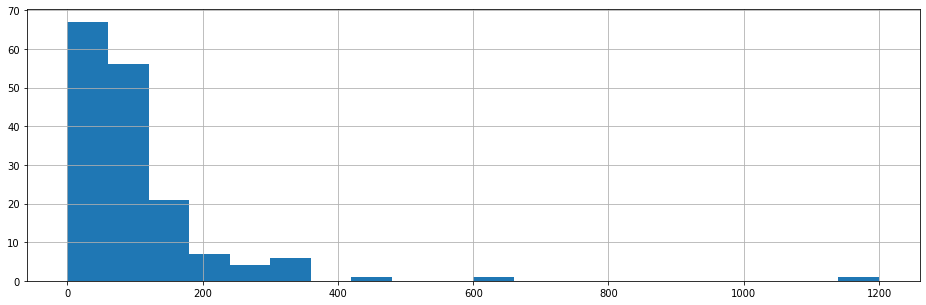

In [ ]:
plt.figure(figsize=(16, 5))
df.query('category == "столовая"')['seats'].hist(bins = 20);

In [ ]:
df.query('category == "столовая"')['seats'].describe()

count     164.000000
mean       99.750000
std       122.951453
min         0.000000
25%        40.000000
50%        75.500000
75%       117.000000
max      1200.000000
Name: seats, dtype: float64

В категории "столовая" 164 точки. Среднее/медианное значение количества мест - 75/100 мест. Есть выбросы - 0 снизу, свыше 350 по вернему краю.

Несколько упростим наши графики, заменив распределение по корзинам средним и медианой для каждой категории заведения.

In [ ]:
df_category = df.groupby('category')['seats'].agg(['mean', 'median']).reset_index()
df_category = df_category.sort_values(by = 'mean', ascending=False).reset_index()
df_category = df_category.drop('index', axis=1)
#df_category.columns = ['mean', 'count']
df_category

,category,mean,median
0,"бар,паб",124.532051,82.5
1,ресторан,121.944094,86.0
2,кофейня,111.199734,80.0
3,столовая,99.750000,75.5
4,быстрое питание,98.891117,65.0
5,кафе,97.512315,60.0
6,пиццерия,94.496487,55.0
7,булочная,89.385135,50.0


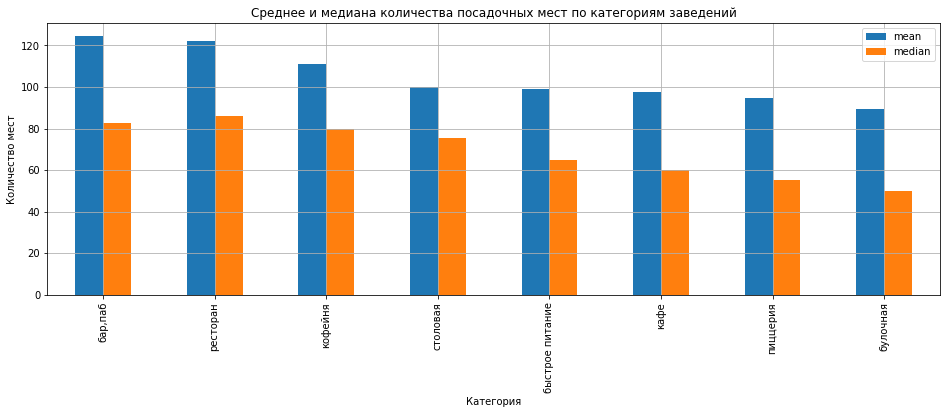

In [ ]:
df_category.plot(kind='bar', x='category', y=['mean', 'median'], grid=True, figsize=(16, 5));
# Оформляем графики
plt.title('Среднее и медиана количества посадочных мест по категориям заведений')
plt.xlabel('Категория')
plt.ylabel('Количество мест', rotation=90);

Все медианы сдвинуты (и значительно сдвинуты) относительно среднего. Это говорит о значительных выбросах в количестве посадочных мест. Если бы целью исследования были бы рекомендации о размерах зала, нужно было бы обратить больше внимания на этот факт. И разобраться с отбрасыванием данных.

***Вывод по разделу:***

Количество посадочных мест в заведениях общественного питания распределены по категориям достаточно равномерно:
Практически во всех категориях половина всех заведений имеет до 100 посадочных мест и 75% до 150 посадочных мест. Практически во всех категориях наблюдаются выбросы от 350 до 1288 посадочных мест, причем в пяти из восьми категорий есть максимальный выброс 1288 мест, что говорит от неточности данных. Во всех категориях присутствуют заведения с количеством мест равным 0. Скорее всего это неточности заполнения исходных форм. Если данные по количеству мест в какой-либо категории понадобяться для принятия решения, необходимо будет очистить от недостоверных цифр. 

###  Анализ сетевых заведений общественного питания

Рассмотрим соотношение сетевых и несетевых заведений в датасете.

In [ ]:
df_chain = df.groupby('chain')['address'].count()
df_chain = df_chain.sort_values(ascending=False)
df_chain # Распределение количества сетевых(1) и несетевых(0) заведений. Сортировка от большего к меньшему

chain
0    5201
1    3205
Name: address, dtype: int64

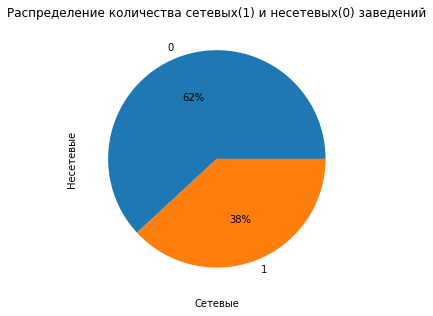

In [ ]:
df.groupby(['chain'])['address'].count().plot(kind='pie', y='address', autopct='%1.0f%%', figsize=(5, 5))
# Оформляем графики
plt.title('Распределение количества сетевых(1) и несетевых(0) заведений')
plt.xlabel('Сетевые')
plt.ylabel('Несетевые', rotation=90);
#plt.legend();;

Посмотрим, как распределены среди сетевых заведения по категориям: 

In [ ]:
df_chain_category = df.query('chain == 1').groupby('category')['address'].count().reset_index()
df_chain_category = df_chain_category.sort_values(by = 'address', ascending=False).reset_index().drop('index', axis=1)
df_chain_category.columns = ['category', 'count']
df_chain_category['ratio'] = round (df_chain_category['count'] / (df_chain_category['count'].sum()), 5)
df_chain_category # Распределение сетевых заведений общественнного питания по категориям. сортировка от большего к меньшему

,category,count,ratio
0,кафе,779,0.24306
1,ресторан,730,0.22777
2,кофейня,720,0.22465
3,пиццерия,330,0.10296
4,быстрое питание,232,0.07239
5,"бар,паб",169,0.05273
6,булочная,157,0.04899
7,столовая,88,0.02746


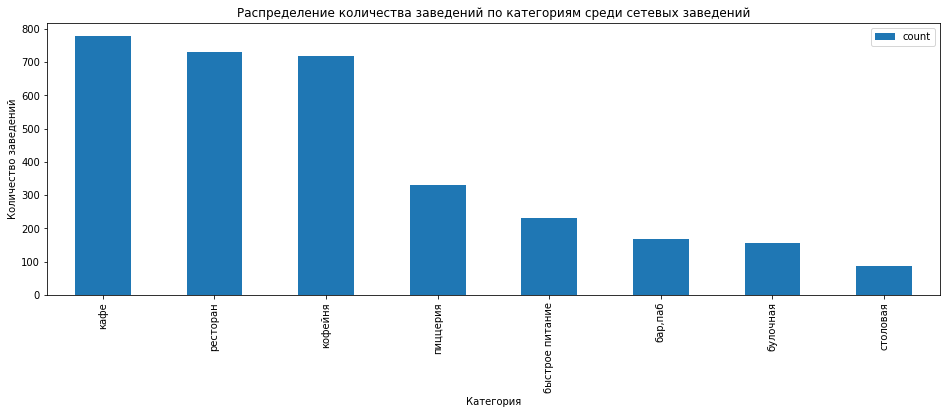

In [ ]:
#plt.figure(figsize=(16, 5))
df_chain_category.plot(kind='bar', x='category', y='count', figsize=(16, 5));
# Оформляем графики
plt.title('Распределение количества заведений по категориям среди сетевых заведений')
plt.xlabel('Категория')
plt.ylabel('Количество заведений', rotation=90);
#plt.legend();

Выявим, сколько сетевых заведений к каждой категории и сколько в пропорции составляет сетевые рестораны от общего числа.

In [ ]:
pd.pivot_table (df, index='category', columns='chain', values='address', aggfunc='count')

chain,0,1
category,,
"бар,паб",596,169
булочная,99,157
быстрое питание,371,232
кафе,1599,779
кофейня,693,720
пиццерия,303,330
ресторан,1313,730
столовая,227,88


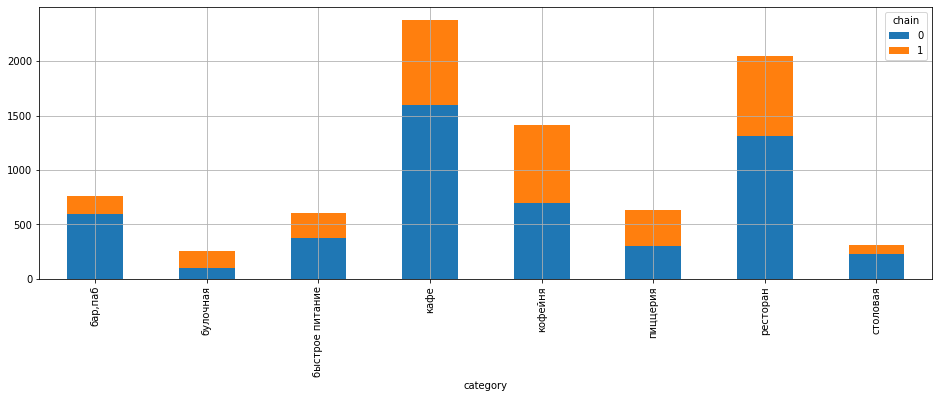

In [ ]:
pd.pivot_table (df, index='category', columns='chain', values='address', aggfunc='count') \
.plot(kind='bar', stacked=True, grid=True, figsize=(16, 5));

***Вывод по разделу:***

Примерно треть заведений общественного питания в Москве сетевые. Именно так распреденены в датасете данные. 

Сетевые заведения общественного питания распределены по категориям несколько в иной пропорции, чем общее распределение. В процентном отношении сетевых ресторанов, кафе несколько меньше, чем долей всего. Сетевых булочных и пицерий больше половины.

Сетевых кофеен - чуть больше половины.

###  Анализ сетевых заведедений по сетям

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве, остальные заведения, которые числяться сетевыми объеденим в группу "other". Таким образом, получим распределение ресторанов по самым популярным сетям и все остальные сетевые заведения.

In [ ]:
df_chain_name = df.query('chain == 1').groupby('name')['address'].count().reset_index()
df_chain_name = df_chain_name.sort_values(by = 'address', ascending=False).reset_index().drop('index', axis=1)
d = len (df_chain_name)
other = df_chain_name.loc[15:d]['address'].sum()
top = df_chain_name.head(15)
new_row = {'name':'other', 'address':other} #append row to the dataframe 
top = top.append(new_row, ignore_index=True)
# Источник: https://tonais.ru/library/dobavlenie-stroki-dataframe

top

,name,address
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


In [ ]:
from plotly import graph_objects as go
fig = go.Figure(data=[go.Pie(labels=top['name'], values=top['address'])])
fig.show() 

***Вывод по разделу:***

Пятнадцать самых популярных сетей в общественном питании Москвы занимают лишь четверть рынка сетевого питания. Даже мне, жителю Санкт-Петербурга, знакомы названия из ТОР-15 Москвы - Шоколадница, Домино, Додо Пицца, Яндекс Лавка, Хинкальная, Теремок. Часть названий я встречал и в других городах, когда бывал там. В ТОР-15 Москвы попали севые заведения, распространеные по всей стране. В основном это заведения быстрого питания.	

###  Анализ расположения заведений общественного питания

Рассмотрим распределение по районам Москвы заведений общественного питания.

In [ ]:
df_district = df.groupby('district')['address'].count()
df_district = df_district.sort_values(ascending=False)
df_district # Распределение количества заведений по районам. Сортировка от большего к меньшему

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: address, dtype: int64

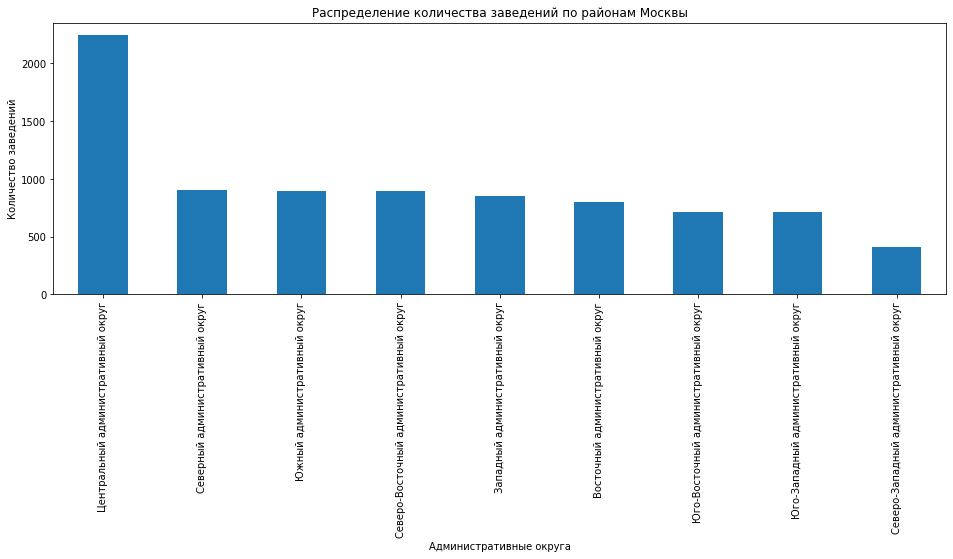

In [ ]:
df_district.plot(kind='bar', y='count', figsize=(16, 5));
# Оформляем графики
plt.title('Распределение количества заведений по районам Москвы')
plt.xlabel('Административные округа')
plt.ylabel('Количество заведений', rotation=90);
#plt.legend();

Как видно основное количество заведений питания сосредоточено в центре Москвы. Центр - самое туристическое и людное место столицы. В окраинных округах распределение равномерное, за исключением Северо-Западного административного округа, где заведений общественного питания практически в 2 раза меньше, чем в остальных нецентральных районах.

Посмотрим, как распределяются внутри округов заведения по категориям:

In [ ]:
df_district_cat = pd.pivot_table (df, index='district', columns='category', values='address', aggfunc='count')
df_district_cat
#df_district = df_district.sort_values(by='ресторан', ascending=False)
#df_district_cat # Распределение количества заведений по районам. Сортировка от большего к меньшему

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,239,150,71,218,24
Северный административный округ,68,39,58,235,193,77,189,41
Северо-Восточный административный округ,63,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


На графике (гистограме) видно, что в долевом отношении ресторанов и баров в центральном районе больше, чем на окраинах.

***Вывод по разделу:***

Заведения общественного питания в Москве распологаются неравномерно. Самое большое количество сосредоточено в центре города - самом многолюдном и туристическом месте. Категории в центре наиболее дорогие - рестораны и бары.

###  Анализ средних рейтингов по категориям заведений

Расчитаем средние рейтинги по категориям заведений общественного питания г.Москва.

rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)

In [ ]:
df_rating = df.groupby('category')['rating'].mean()
df_rating = df_rating.sort_values(ascending=False)
df_rating # Распределение количества заведений по районам. Сортировка от большего к меньшему

category
бар,паб            4.387712
пиццерия           4.301264
ресторан           4.290357
кофейня            4.277282
булочная           4.268359
столовая           4.211429
кафе               4.123886
быстрое питание    4.050249
Name: rating, dtype: float64

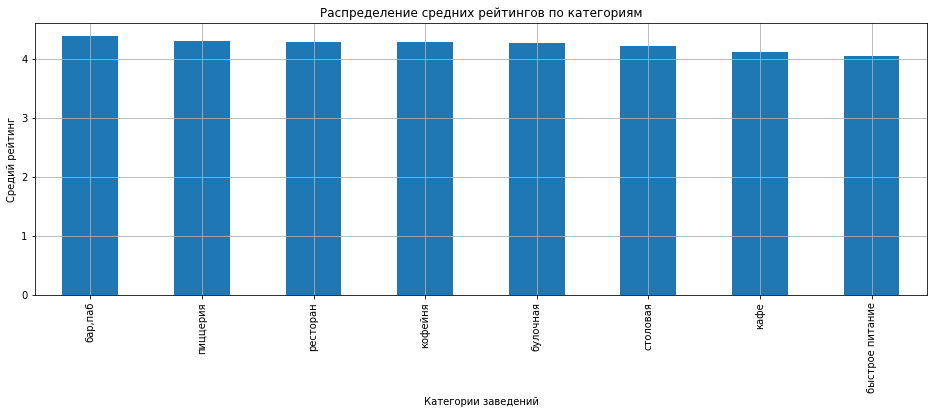

In [ ]:
df_rating.plot(kind='bar', y='count', grid=True, figsize=(16, 5));
# Оформляем графики
plt.title('Распределение средних рейтингов по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Средий рейтинг', rotation=90);
#plt.legend();

<div class="alert alert-success">
<b>Комментарий ревьюера v2:</b>☀️
   
Ниже примерчик предложил

</div>

<AxesSubplot:xlabel='category', ylabel='rating'>

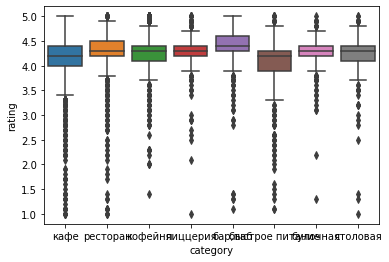

In [ ]:
# Код ревьюера
import seaborn as sns
sns.boxplot(data=df, x="category", y="rating")

Гистограмма получилась неинформативной, эту недоработку исправим в следуюшем разделе работы.

***Вывод по разделу:***

Заведения общественного питания в Москве вне зависимости от категории заведения имеют высокий средний рейтинг, это говорит о высоком среднем обслуживанни во всех пунтах питания. Рейтинги в барах-ресторанах несколько выше, чем в столовых, кафе быстрого питания. Скорее всего это связано с завышенными ожиданиями потребителей при посещении невысоких категорий заведений общественного питания.

###  Построение фонововой картограммы (хороплета) со средним рейтингом заведений каждого района

Собираем хороплет по аналогии с работой на практических занятиях:

In [ ]:
df['district'].unique() # Собираем уникальные названия районов Москвы

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

В датасете представлено 9 округов.

Для каждого округа посчитаем средний рейтинг заведений общественного питания, которые находятся на его территории:

In [ ]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
round (rating_df, 3)

,district,rating
0,Восточный административный округ,4.174
1,Западный административный округ,4.182
2,Северный административный округ,4.240
3,Северо-Восточный административный округ,4.148
4,Северо-Западный административный округ,4.209
5,Центральный административный округ,4.378
6,Юго-Восточный административный округ,4.101
7,Юго-Западный административный округ,4.173
8,Южный административный округ,4.184


In [ ]:
# подключаем модуль для работы с JSON-форматом
import json

In [ ]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [ ]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений общ. питания по районам',
).add_to(m)

# выводим карту
m

***Вывод по разделу:***

На карте хорошо видно, что высокие рейтинги в центре и на северо-западе, а самые низкие на юго-востоке столицы

###  Отображение на карте всех заведений датасета с помощью кластеров средствами библиотеки folium

Собираем карту по аналогии с работой на практических занятиях.

Отметим все заедения общественного питания на карте с помощью кластеров:

In [ ]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

***Вывод по разделу:***

При увеличении масштаба с помощью колёсика мышки или кнопок на карте можно увидеть, что кластеры автоматически перегруппировываются: при достаточном приближении из кластеров начнут «выпадать» отдельные маркеры с точками общественного питания. Всплывающие окна и подсказки для них реализованы точно так же, как и для отдельных маркеров.

Наиболее плотное заполнение пространства заведениями общественного питания в центре столицы, а также северо-запад. Плотность в центре Москвы равномерная, а по окраинным районам заведения в основном сосредоточены вдоль радиальных проспектов и улиц и у станций пересалок и метро. Это наблюдение подтверждается здравым смыслом, так как в центре потенциальных посетителей много везде, а на окраинах сосредоточение людей вдоль маршрутов движения.

###  Самые ресторанные улицы

Выберем самые ресторанные улицы - улицы, на которых находятся самое большое количество заведений общественного питания.

In [ ]:
df_street = df.groupby('street', as_index=False)['address'].agg('count').sort_values(by = 'address',ascending=False)
df_street = df_street.head(15)['street']
list_15_street = list (df_street)
list_15_street # Список самых ресторанных улиц Москвы

[' проспект Мира',
 ' Профсоюзная улица',
 ' проспект Вернадского',
 ' Ленинский проспект',
 ' Ленинградский проспект',
 ' Дмитровское шоссе',
 ' Каширское шоссе',
 ' Варшавское шоссе',
 ' Ленинградское шоссе',
 ' МКАД',
 ' Люблинская улица',
 ' улица Вавилова',
 ' Кутузовский проспект',
 ' улица Миклухо-Маклая',
 ' Пятницкая улица']

In [ ]:
df_street_cat = df.query ('street in @list_15_street')
df_street_cat # Выборка всех заведений на самых ресторанных улицах

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,МКАД,False
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.876908,37.449876,4.4,средние,Средний счёт:350–500 ₽,425.0,NaN,0,96.0,Ленинградское шоссе,True
26,Пикочино,пиццерия,"Москва, Дмитровское шоссе, 107к2",Северный административный округ,"пн-чт 11:00–22:00; пт,сб 11:00–23:00; вс 11:00...",55.879390,37.541228,4.5,средние,Средний счёт:300–1500 ₽,900.0,NaN,0,NaN,Дмитровское шоссе,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,МКАД,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,Назис Пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,0,NaN,Люблинская улица,False
8396,Пекинский Двор,ресторан,"Москва, Ленинский проспект, 158",Западный административный округ,"ежедневно, 11:00–23:00",55.651706,37.482667,4.3,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,200.0,Ленинский проспект,False
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,Профсоюзная улица,False
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,Люблинская улица,True


In [ ]:
df_street_cat = pd.pivot_table (df_street_cat, index='street', columns='category', values='address', aggfunc='count')
df_street_cat # Первое распределение по категориям на ресторанных улицах Москвы

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,NaN,7.0,17.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0


Отсутствие значений в первой таблице - это, скорее всего, отсутствие заведений данной категории по этому адресу. Поэтому смело заменяем NaN нулями.

In [ ]:
df_street_cat = df_street_cat.fillna(0.)
df_street_cat # Замена пропусков нулями

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6.0,0.0,7.0,17.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,0.0,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,25.0,3.0
Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
Люблинская улица,5.0,0.0,5.0,26.0,11.0,1.0,10.0,2.0
МКАД,1.0,0.0,9.0,45.0,4.0,0.0,5.0,1.0


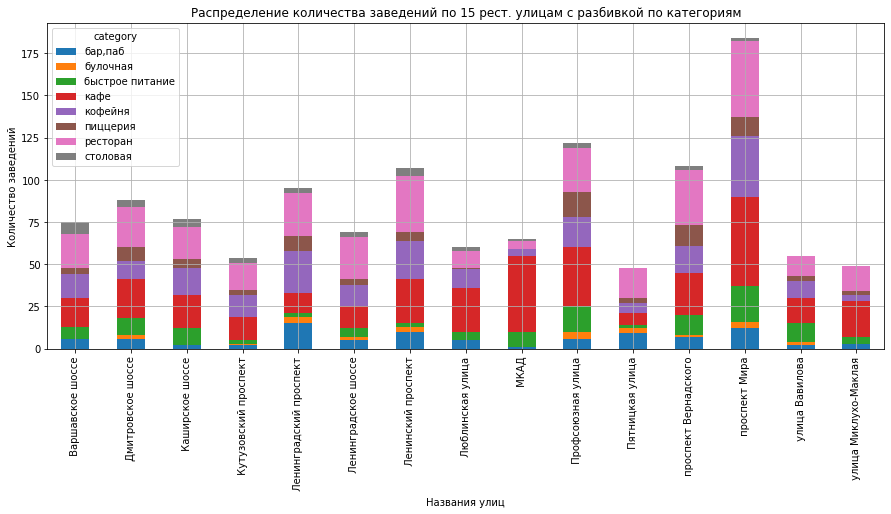

In [ ]:
df_street_cat.plot(kind='bar', grid=True, figsize= (15,6), stacked=True) #.sort_values(by='ресторан', ascending=False)
# Оформляем графики
plt.title('Распределение количества заведений по 15 рест. улицам с разбивкой по категориям')
plt.xlabel('Названия улиц')
plt.ylabel('Количество заведений', rotation=90);

***Вывод по разделу:***

При составления ТОР-15 улиц с самым большим количеством заведений общественного питания в список попал МКАД - самая длинная магистраль Москвы. На МКАД второе по значению количество кафе. Возможно это кафе на заправках. В список попали центральные улицы - Пятницкая и самые протяженные радиальные магистрали.

###  Улицы с одним объектом общепита

Найдем улицы, на которых находится только один объект общепита.

In [ ]:
df_street_min = df.groupby('street', as_index=False)['address'].agg('count').sort_values(by = 'address',ascending=True)
#df_street_min.columns
df_street_min = df_street_min[df_street_min['address'] == 1]
df_street_min
list_street_min = list (df_street_min['street'])
list_street_min # Список улиц Москвы, где есть только один объект общепита


[' 1-й Автозаводский проезд',
 ' Городецкая улица',
 ' Ступинский проезд',
 ' Сумская',
 ' Сумской проезд',
 ' Сытинский переулок',
 ' Глубокий переулок',
 ' Гжельский переулок',
 ' Сытинский тупик',
 ' Талдомская улица',
 ' Таможенный проезд',
 ' Газгольдерная улица',
 ' Гагаринский переулок',
 ' Гаврикова улица',
 ' Тарутинская улица',
 ' Выползов переулок',
 ' Таёжная улица',
 ' Воронцовский парк',
 ' Товарищеский переулок',
 ' Токмаков переулок',
 ' Триумфальная площадь',
 ' Троилинский переулок',
 ' Трёхпрудный переулок',
 ' Турчанинов переулок',
 ' Тучковская улица',
 ' Тюменский проезд',
 ' Городская улица',
 ' Гороховский переулок',
 ' Стромынский переулок',
 ' Стрелецкая улица',
 ' Ереванская улица',
 ' Смоленская-Сенная площадь',
 ' Советская улица',
 ' Солянский тупик',
 ' Дурасовский переулок',
 ' Софийская набережная',
 ' Средний Тишинский переулок',
 ' Дорогобужская улица',
 ' Ставропольская улица',
 ' Ставропольский проезд',
 ' Старокаширское шоссе',
 ' Староконюшенный п

Приглядимся повнимательнее, что это за объекты. Посмотрим в каких категориях работают эти заведения и какие у них рейтинги.

In [ ]:
df_street_min = df.query ('street in @list_street_min')
df_street_min # Выборка всех заведений, по одному на улице

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,1,NaN,Угличская улица,False
71,CofeFest,кофейня,"Москва, Новгородская улица, 23А",Северо-Восточный административный округ,пн-пт 08:00–19:00,55.901799,37.577672,4.1,NaN,NaN,NaN,NaN,1,NaN,Новгородская улица,False
97,Жигулевское,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,Бибиревская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


In [ ]:
df_street_min = pd.pivot_table (df_street_min, index='rating', columns='category', values='address', aggfunc='count')
df_street_min 

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
rating,,,,,,,,
1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
1.4,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
2.6,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
2.7,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
2.8,NaN,NaN,NaN,2.0,NaN,NaN,1.0,NaN
2.9,NaN,NaN,NaN,1.0,NaN,NaN,2.0,NaN
3.0,NaN,NaN,2.0,1.0,NaN,NaN,NaN,1.0
3.1,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
3.3,NaN,NaN,1.0,1.0,NaN,NaN,1.0,NaN


In [ ]:
df_street_min = df_street_min.fillna(0.)
df_street_min # Замена пропусков нулями

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
rating,,,,,,,,
1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1.4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2.6,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2.7,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2.8,0.0,0.0,0.0,2.0,0.0,0.0,1.0,0.0
2.9,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0
3.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,1.0
3.1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3.3,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0


***Вывод по разделу:***

Объекты общественного питания, находящиеся на улицах в единственном числе работают во всех категориях. Наиболее они перставлены в категории кафе-рестораны. Рейтинги не высокие по всем категориям. Сказывается отсутствие конкуренции.

### Построение фоновой картограммы (хороплет) среднего чека для каждого района

В столбце middle_avg_bill храниться примерная стоимость заказа в рублях в заведении. Посчитаем медиану этого столбца для каждого района. Будем использовать это значение в качестве ценового индикатора района. по аналогии с заданием в упражениях построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [ ]:
middle_avg_bill_df = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
middle_avg_bill_df.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [ ]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений общ. питания по районам',
).add_to(m)

# выводим карту
m

***Вывод по разделу:***

Медианные чеки в разных районах Москвы отличаются в 2 раза. Медианный чек в заведениях центра и юго-запада столицы дороже, чем на юго-востоке и северо востоке. Направление от центра в сторону Новой Москвы по заведениям общественного питания самое дорогое. 

### ***Вывод по главе Анализ данных:***

В главе Анализ данных были рассмотрены следующие взаимосвязи в датасете и высказаны предположения и рекомендации:
- ***Наибольшее количество*** заведений имеют категорию ***"Кафе" и "Ресторан"***, что не удивительно, так как это привычно для потребителя;
- ***Половина*** всех заведений имеет ***до 100 посадочных мест*** и 75% до 150 посадочных мест, заведений с большим числом посадочных мест не много, больше 350 посадочных мест можно считать исключениями;
- Примерно ***треть***- ( 38 % ) заведений общественного питания в Москве ***сетевые***. В основном это российские сети, представленные во многоих городах нашей страны. Сетевики больше преставлены в категориях кафе и быстрое питание;
- Заведения общественного питания в Москве распологаются неравноменно. Самое ***большое количество*** сосредоточено ***в центре*** города - самом многолюдном и туристическом месте. Категории в центре наиболее дорогие - рестораны и бары;
- ***Средний рейтинг*** заведений общественного питания по всем районам Москвы высок и равномерн от ***4,0 до 4,4*** баллов;
- Больше всего заведений общественного питания расположено на радиальных длинных улицах и проспектах, самые дорогие в центре и в направлении юго-востока на Новую Москву;
- Средние (медианные) чеки для разных округов Москвы отличаются в 2 раза. В центре и на юго-восток дороже.

## Детализация исследования: открытие кофейни

Мечта инвесторов из фонда «Shut Up and Take My Money» — открыть такую же крутую и доступную, как «Central Perk» из сериала «Друзья», кофейню в Москве. Заказчики не высказывают  боязни о конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Собираем информацию для клиентов по вопросу открытия кофейни в Москве, подготовить и дать рекомендации.

### Рынок кофеен в Москве

Выясним, сколько кофеен в Москве

In [ ]:
df.query('category == "кофейня"').shape[0]

1413

In [ ]:
print ('В Москве ', df.query('category == "кофейня"').shape[0], 'заведений общепита называют себя "кофейня".')

В Москве  1413 заведений общепита называют себя "кофейня".


Посмотрим распределение этих заведений по районам.

In [ ]:
df_district_coff = df.query('category == "кофейня"').groupby('district')['address'].count()
df_district_coff = df_district_coff.sort_values(ascending=False)
df_district_coff # Распределение количества заведений по районам. Сортировка от большего к меньшему

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: address, dtype: int64

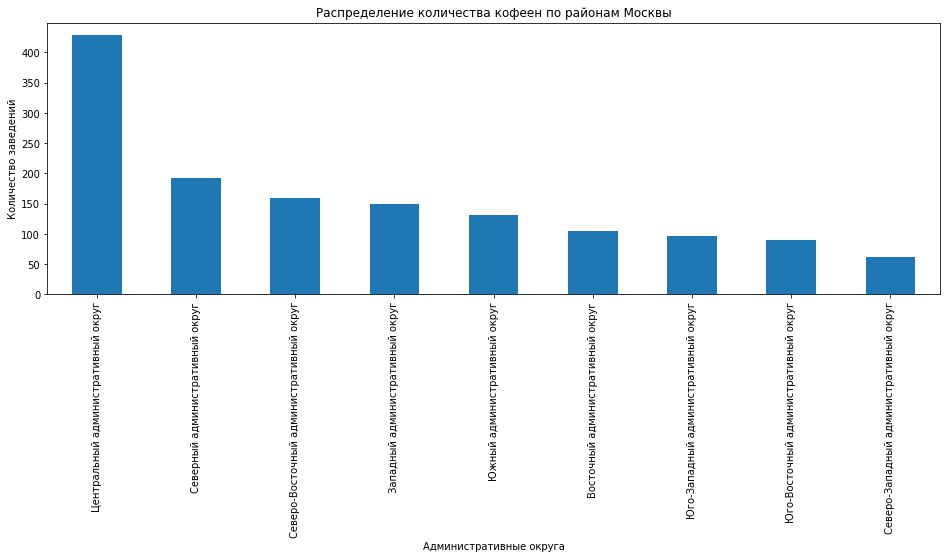

In [ ]:
df_district_coff.plot(kind='bar', y='count', figsize=(16, 5));
# Оформляем графики
plt.title('Распределение количества кофеен по районам Москвы')
plt.xlabel('Административные округа')
plt.ylabel('Количество заведений', rotation=90);
#plt.legend();

Посмотрим, насколько плотно они расположены на карте Москвы.

Для удобства обработки создадим датасет df1, в который войдут только кофейни.

In [ ]:
df1 = df.query('category == "кофейня"')

In [ ]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df1.apply(create_clusters, axis=1)
# выводим карту
m

***Вывод по разделу:***

В Москве 1413 кофеен, в основном они расположены в центре и более элитных направлениях.

Центр перегружен объектами общественного питания, при открытии кофейни имеет смысл сосредоточиться на окраинах:


- В центре кофейни расположены достаточно равномерно. На окраинах в торговых центрах и у пересадочных узлов
Кофейни в нецентральных районах ближе к МКАД в основном расположены в торговых центрах и пересадочных узлах, а также вдоль радиальных улиц и проспектов  для обеспечения большего прохода.

### На карте посмотрим особенности расположения на примере кофеен находящихся на юге и юго-востоке Москвы.

Выбор южного направления обоснован тем, что там не очень много кофеен - меньше конкуренция.

Из 23 кофеен 19 расположены в местах большой проходимостью - торговых центрах у станций метро и остановок общественного транспорта. И лишь 3 заведения расположены в отдельностоящих домах, проходимость вдоль которых понять на карте трудно. Одно заведение находиться на МКАДе у внутреннего кольца, видимо это заправка.

Примерно такая же картина на юго-восточном направлении. Но в том направлении есть ньюанс. Достаточно много торговых центров, где нет кофеен - точнее заведений общественного питания из категории "кофейня"

### Часы работы кофеен

Посмотрим, есть ли круглосуточные кофейни?

In [ ]:
print ('Да, таких кофеен ', df1[df1[' is_24_7']].shape[0], 'из ',df1.shape[0], '.' )

Да, таких кофеен  59 из  1413 .


Посмотрим, где они находятся?

In [ ]:
pd.pivot_table (df1[df1[' is_24_7']], index='district', columns='category', values='address', aggfunc='count')

category,кофейня
district,
Восточный административный округ,5
Западный административный округ,9
Северный административный округ,5
Северо-Восточный административный округ,3
Северо-Западный административный округ,2
Центральный административный округ,26
Юго-Восточный административный округ,1
Юго-Западный административный округ,7
Южный административный округ,1


Как иследовало ожидать в центре и на западе. А в южном и юго-восточном направлении по 1 заведению.

***Вывод по разделу:***

Из всех работающих кофеен имеют круглосуточный график аботы лишь 59 заведений. По 1му заведению общ. питания в ЮАО и ЮВАО, три в СЗАО. Кофейни в основном расположены в торговых центрах и пересадочных узлах для обеспечения большего прохода. Незначительное количество кофеен работает круглосуточно в основном в центре.

Можно рекомендовать, при открытии новой кофейни рассматривать для нее круглосуточный график работы.

### Рейтинги кофеен

Посмотрим средний рейтинг по кофейням по городу

In [ ]:
print ('Cредний рейтинг по кофейням по городу ', round (df1['rating'].mean(), 4), 'из 5.0000.')

Cредний рейтинг по кофейням по городу  4.2773 из 5.0000.


Посмотрим по районам:

In [ ]:
pd.pivot_table (df1, index='district', columns='category', values='rating', aggfunc='mean') \
.sort_values(by='кофейня', ascending=False)

category,кофейня
district,
Центральный административный округ,4.336449
Северо-Западный административный округ,4.325806
Северный административный округ,4.291710
Юго-Западный административный округ,4.283333
Восточный административный округ,4.282857
Южный административный округ,4.232824
Юго-Восточный административный округ,4.225843
Северо-Восточный административный округ,4.216981
Западный административный округ,4.195333


In [ ]:
#В табличке плохо видно. посмотрим на графике

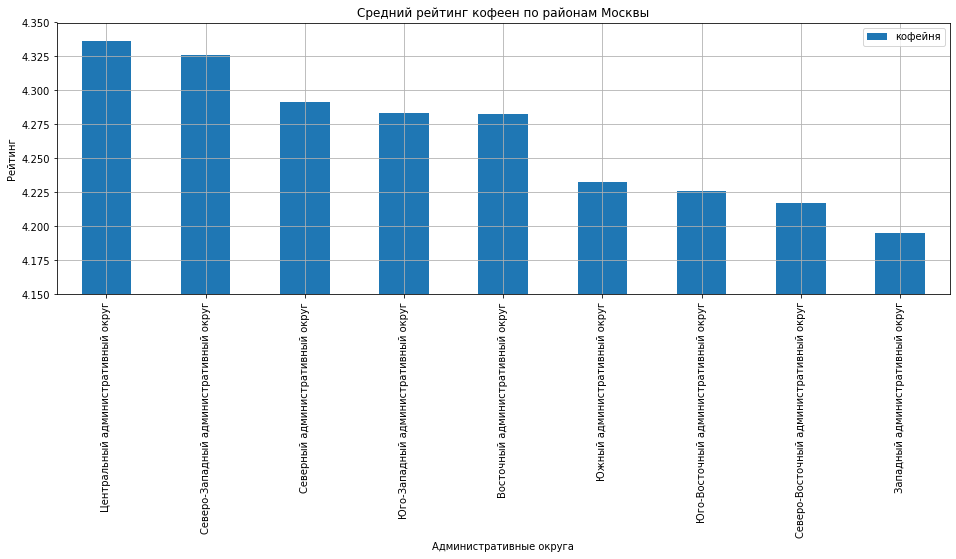

In [ ]:
pd.pivot_table (df1, index='district', columns='category', values='rating', aggfunc='mean') \
.sort_values(by='кофейня', ascending=False).plot(kind='bar', grid=True, y='кофейня', figsize=(16, 5));
# Оформляем графики
plt.title('Средний рейтинг кофеен по районам Москвы')
plt.xlabel('Административные округа')
plt.ylabel('Рейтинг', rotation=90)
plt.ylim([4.15, 4.35]);
#plt.legend();

In [ ]:
# Cреди круглосуточных
pd.pivot_table (df1[df1[' is_24_7']], index='district', columns='category', values='rating', aggfunc='mean')\
.sort_values(by='кофейня', ascending=False)

category,кофейня
district,
Восточный административный округ,4.300000
Центральный административный округ,4.288462
Юго-Западный административный округ,4.271429
Северо-Западный административный округ,4.250000
Северный административный округ,4.220000
Западный административный округ,4.200000
Южный административный округ,4.000000
Северо-Восточный административный округ,3.866667
Юго-Восточный административный округ,2.300000


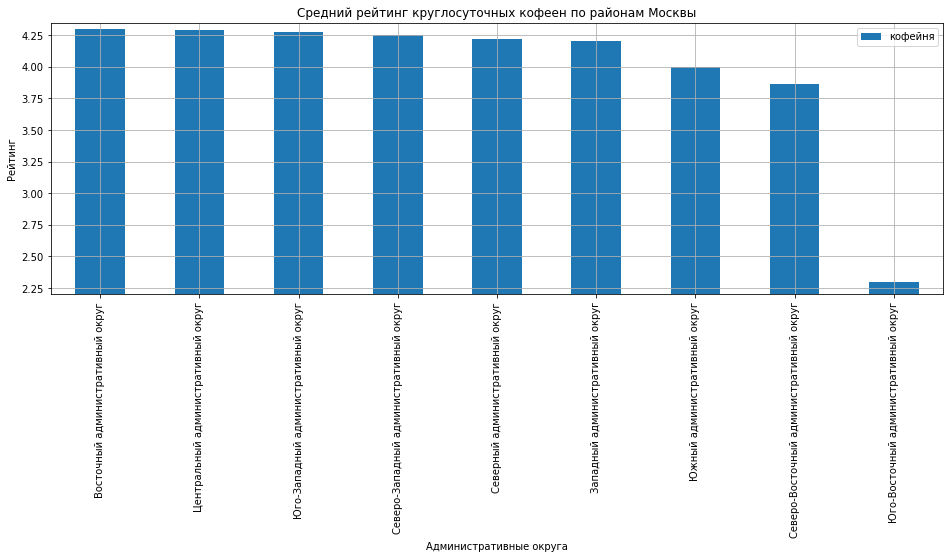

In [ ]:
pd.pivot_table (df1[df1[' is_24_7']], index='district', columns='category', values='rating', aggfunc='mean') \
.sort_values(by='кофейня', ascending=False).plot(kind='bar', grid=True, y='кофейня', figsize=(16, 5));
# Оформляем графики
plt.title('Средний рейтинг круглосуточных кофеен по районам Москвы')
plt.xlabel('Административные округа')
plt.ylabel('Рейтинг', rotation=90)
plt.ylim([2.2, 4.35]);
#plt.legend();

Вот уже начинает поблескивать золодце - рейтинг у единственной круглосуточной кофейни  в  Юго-Восточном административном округе - 2.3. Да и в Южном тоже не велик - 4.0. В Северо-Восточном округе на 3 Кофейни рейтинг 3.87. Тоже нужно обратить внимание.

### Цена чашки кофе

Сведения цене чашки кофе в таблице содержатьсчя в столбце middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»: Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

In [ ]:
print ('Cредняя цена чашки капучино по г. Москва ', round (df1['middle_coffee_cup'].mean(), 2),' руб.')

Cредняя цена чашки капучино по г. Москва  175.06  руб.


Проверим по районам:

In [ ]:
pd.pivot_table (df1, index='district', columns='category', values='middle_coffee_cup', aggfunc='mean') \
.sort_values(by='кофейня', ascending=False)

category,кофейня
district,
Западный административный округ,189.938776
Центральный административный округ,187.518519
Юго-Западный административный округ,184.176471
Восточный административный округ,174.023810
Северный административный округ,165.789474
Северо-Западный административный округ,165.523810
Северо-Восточный административный округ,165.333333
Южный административный округ,158.488372
Юго-Восточный административный округ,151.088235


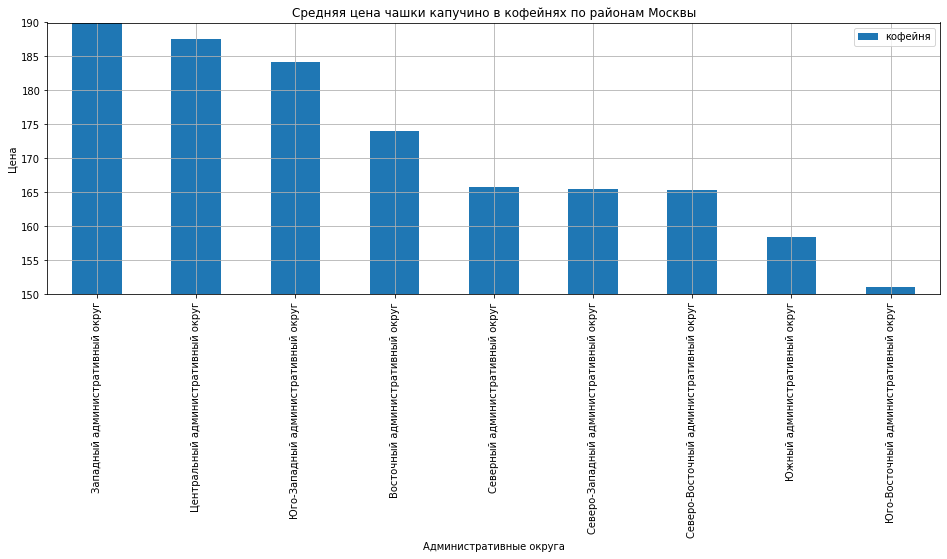

In [ ]:
#Посмотрим на графике
pd.pivot_table (df1, index='district', columns='category', values='middle_coffee_cup', aggfunc='mean') \
.sort_values(by='кофейня', ascending=False).plot(kind='bar', grid=True, y='кофейня', figsize=(16, 5));
# Оформляем графики
plt.title('Средняя цена чашки капучино в кофейнях по районам Москвы')
plt.xlabel('Административные округа')
plt.ylabel('Цена', rotation=90)
plt.ylim([150, 190]);
#plt.legend();

А как ценник по круглосуточным кофейням?

In [ ]:
pd.pivot_table (df1[df1[' is_24_7']], index='district', columns='category', values='middle_coffee_cup', aggfunc='mean')\
.sort_values(by='кофейня', ascending=False)

category,кофейня
district,
Северный административный округ,285.000000
Юго-Западный административный округ,249.500000
Западный административный округ,245.333333
Центральный административный округ,217.400000
Северо-Восточный административный округ,170.000000
Восточный административный округ,110.000000


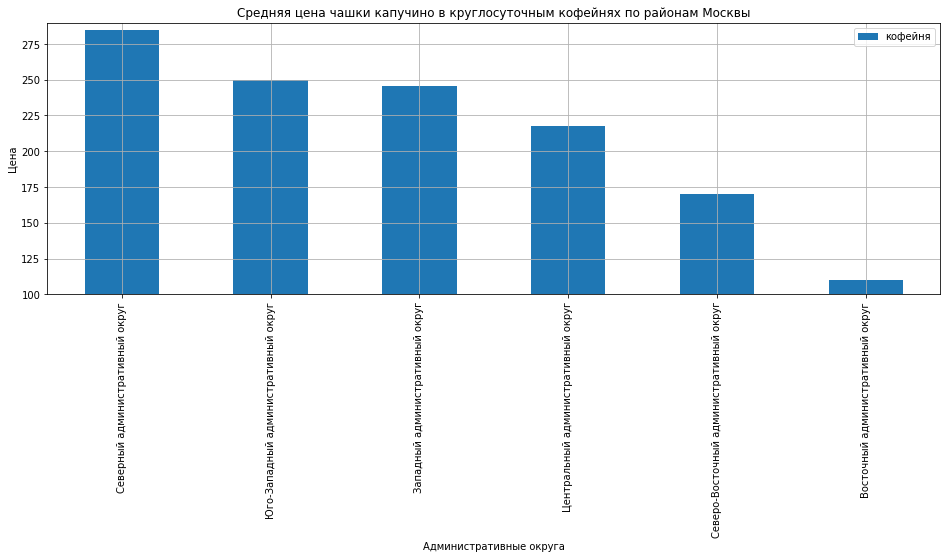

In [ ]:
pd.pivot_table (df1[df1[' is_24_7']], index='district', columns='category', values='middle_coffee_cup', aggfunc='mean') \
.sort_values(by='кофейня', ascending=False).plot(kind='bar', grid=True, y='кофейня', figsize=(16, 5));
# Оформляем графики
plt.title('Средняя цена чашки капучино в круглосуточным кофейнях по районам Москвы')
plt.xlabel('Административные округа')
plt.ylabel('Цена', rotation=90)
plt.ylim([100, 290]);
#plt.legend();

***Вывод по разделу:***

Cредняя цена чашки капучино по г. Москва  175.06  руб. По районам цена меняется. Самая высокая цена в центре и на западе, самая низкая в круглосуточных кафе на востоке.

Средние цены чашки капучино кофеен, работающих только днем,  от района к району отличаются в 1,5 раза. 
Для круглосуточных кофеен цена чашки капучино в Восточном округе  -110 руб. - самая низкая по Москве. В круглосуточных заведениях средняя цена чашки выше, чем в заведениях работающих только днем. Не во всех районах  есть заведения работающие круглосуточно.


### Расуждения для формирования рекомендаций открытия кофейни

Рассматривая возможность открытия кофейни в городе Москва в интересах фонда «Shut Up and Take My Money» обобщим полученные результаты:

- Центр города хорошее место место для открытия новой кофейни, но там таких заведений очень много - велика конкуренция;

Выбирая между круглосуточной кофейней и кофейней, работающей только днем можно рекомендовать круглосуточную, исходя из следующих соображений:
- цены в круглосуточных выше;
- рейтинги конкурентов ниже.

Предыдущий выбор закрывает возможность расположения в торговом центре, так как они ночью не работают.

Самый острый вопрос выбора района. 

Выбирая между южным, юго-восточным направлением и северным, северо-западным, где плотность расположения кофеен практически одинакова можно рекомендовать северо-западное направление, так как там цена чашки кофе несколько выше.

Исходя из просмотренных расположений уже существующих кофеен можно дать рекомендации по расположению помещения для кофейни - на крупной улице или проспекте вблизи транспортного узла (метро или места пересадки).

## Отчеты, выводы и рекомендации

В процессе выполнения учебного проекта были выполнены следующие работы:
- Загружены и подготовлены данные для исследования;
- Предобработаны данные;
- Проанализированы данные всего датасета применительно ко всем категориям заведений общественного питания г. Москвы;
- Более подробно проанализированы данные для категории "Кофейня" для выработки рекомендаций для открытия кофейни в интересах фонда «Shut Up and Take My Money»;
- Сформулированы выводы по каждому разделу и общие выводы и рекомендации.

### Выводы


- Наибольшее количество заведений имеют категорию "Кафе" и "Ресторан", что не удивительно, так как это привычно для потребителя;
- Примерно треть - ( 38 % ) заведений общественного питания в Москве сетевые. В основном это российские сети, представленные во многих городах нашей страны. Сетевики больше приставлены в категориях кафе и быстрое питание;
- Заведения общественного питания в Москве располагаются неравномерно. Самое большое количество сосредоточено в центре города - самом многолюдном и туристическом месте. Категории в центре наиболее дорогие - рестораны и бары;
- Средний рейтинг по всем районам Москвы высок и равномерен от 4,0 до 4,4 баллов;
- Больше всего заведений общественного питания расположено на радиальных длинных улицах и проспектах, самые дорогие в центре и в направлении юго-востока на Новую Москву;
- Средние (медианные) чеки для разных округов Москвы отличаются в 2 раза. В центре и на юго-восток дороже.


### Рекомендации


- В Москве 1413 кофеен;
- Открывать кофейню в центре не разумно – велика конкуренция;
- Можно рекомендовать открывать круглосуточную кофейню, так как таковых не много, не смотря на невозможность открытия в таком случае, в торговом центре;
- При выборе района руководствоваться меньшим количеством аналогичных заведений в этом административном округе и более высокими ценами;
- Выбрать для поиска места для кофейни фонда «Shut Up and Take My Money» Северо-Западный административный округ;
- При поиске помещения для кофейни поступать как большинство существующих кофеен – искать место на крупном проспекте или улице вблизи станций пересадок или метро. 

Презентация: < https://disk.yandex.ru/i/mwPCpH50A4Jf6Q >